In [1]:
import matplotlib.pyplot as plt
import plotly.figure_factory as ff

In [2]:
import math
import statistics
import numpy as np
import scipy.stats
import pandas as pd
import plotly.express as px

## user atom and inferred credibility, results 

In [3]:
user_df = pd.read_csv(
    "userinput.csv")

user_df

,s,socialMediaURL,relatedAtom,inferredCredibility
0,https://nobias-project.eu/SocialMediaUser/Buzz...,https://twitter.com/,https://nobias-project.eu/RandomVariableAtom/RVA1,0.031
1,https://nobias-project.eu/SocialMediaUser/Buzz...,https://twitter.com/,https://nobias-project.eu/RandomVariableAtom/RVA2,1.000
2,https://nobias-project.eu/SocialMediaUser/Buzz...,https://twitter.com/,https://nobias-project.eu/RandomVariableAtom/RVA3,0.854
3,https://nobias-project.eu/SocialMediaUser/Buzz...,https://twitter.com/,https://nobias-project.eu/RandomVariableAtom/RVA4,0.000
4,https://nobias-project.eu/SocialMediaUser/Buzz...,https://twitter.com/,https://nobias-project.eu/RandomVariableAtom/RVA5,0.097
...,...,...,...,...
15111,https://nobias-project.eu/SocialMediaUser/Buzz...,https://twitter.com/,https://nobias-project.eu/RandomVariableAtom/R...,0.047
15112,https://nobias-project.eu/SocialMediaUser/Buzz...,https://twitter.com/,https://nobias-project.eu/RandomVariableAtom/R...,1.000
15113,https://nobias-project.eu/SocialMediaUser/Buzz...,https://twitter.com/,https://nobias-project.eu/RandomVariableAtom/R...,0.000
15114,https://nobias-project.eu/SocialMediaUser/Buzz...,https://twitter.com/,https://nobias-project.eu/RandomVariableAtom/R...,1.000


## user x news matrix at input level

In [4]:
sharingbehav_df = pd.read_csv(
    "news_user_ground.csv")

sharingbehav_df

,sharingBehavior,sharedNews,newsTitle,sharingUser,timesShared,groundTruth
0,https://nobias-project.eu/SharingBehavior/Buzz...,https://nobias-project.eu/News/BuzzfeedNews4,Trump vs. Clinton: A Fundamental Clash over Ho...,https://nobias-project.eu/SocialMediaUser/Buzz...,1,0.0
1,https://nobias-project.eu/SharingBehavior/Buzz...,https://nobias-project.eu/News/BuzzfeedNews4,Trump vs. Clinton: A Fundamental Clash over Ho...,https://nobias-project.eu/SocialMediaUser/Buzz...,1,0.0
2,https://nobias-project.eu/SharingBehavior/Buzz...,https://nobias-project.eu/News/BuzzfeedNews4,Trump vs. Clinton: A Fundamental Clash over Ho...,https://nobias-project.eu/SocialMediaUser/Buzz...,1,0.0
3,https://nobias-project.eu/SharingBehavior/Buzz...,https://nobias-project.eu/News/BuzzfeedNews4,Trump vs. Clinton: A Fundamental Clash over Ho...,https://nobias-project.eu/SocialMediaUser/Buzz...,1,0.0
4,https://nobias-project.eu/SharingBehavior/Buzz...,https://nobias-project.eu/News/BuzzfeedNews4,Trump vs. Clinton: A Fundamental Clash over Ho...,https://nobias-project.eu/SocialMediaUser/Buzz...,1,0.0
...,...,...,...,...,...,...
55565,https://nobias-project.eu/SharingBehavior/Poli...,https://nobias-project.eu/News/PolitifactNews36,Look What Was Just SPOTTED Inside The Student ...,https://nobias-project.eu/SocialMediaUser/Poli...,1,0.0
55566,https://nobias-project.eu/SharingBehavior/Poli...,https://nobias-project.eu/News/PolitifactNews7,Giuliani slams Lester Holt for fact-checking l...,https://nobias-project.eu/SocialMediaUser/Poli...,1,0.0
55567,https://nobias-project.eu/SharingBehavior/Poli...,https://nobias-project.eu/News/PolitifactNews190,"South African firm ordered to lay off 3,389 wh...",https://nobias-project.eu/SocialMediaUser/Poli...,1,1.0
55568,https://nobias-project.eu/SharingBehavior/Poli...,https://nobias-project.eu/News/PolitifactNews217,BREAKING NEWS: Road racing cyclist Lance Armst...,https://nobias-project.eu/SocialMediaUser/Poli...,1,1.0


In [5]:
sharingbehav_df['sharingUser']=sharingbehav_df['sharingUser'][:].str.replace("https://nobias-project.eu/SocialMediaUser/", "")
sharingbehav_df['sharedNews']=sharingbehav_df['sharedNews'][:].str.replace("https://nobias-project.eu/SocialMediaUser/", "")

/var/folders/q3/whys_qrs5rv5hr07rcp5ysg80000gn/T/ipykernel_41628/3224661380.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  sharingbehav_df['sharingUser']=sharingbehav_df['sharingUser'][:].str.replace("https://nobias-project.eu/SocialMediaUser/", "")
/var/folders/q3/whys_qrs5rv5hr07rcp5ysg80000gn/T/ipykernel_41628/3224661380.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  sharingbehav_df['sharedNews']=sharingbehav_df['sharedNews'][:].str.replace("https://nobias-project.eu/SocialMediaUser/", "")


In [6]:
sharingbehav_df['sharedNews']=sharingbehav_df['sharedNews'][:].str.replace("https://nobias-project.eu/News/", "")
sharingbehav_df['sharingBehavior']=sharingbehav_df['sharingBehavior'][:].str.replace("https://nobias-project.eu/SharingBehavior/", "")

/var/folders/q3/whys_qrs5rv5hr07rcp5ysg80000gn/T/ipykernel_41628/2628585722.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  sharingbehav_df['sharedNews']=sharingbehav_df['sharedNews'][:].str.replace("https://nobias-project.eu/News/", "")
/var/folders/q3/whys_qrs5rv5hr07rcp5ysg80000gn/T/ipykernel_41628/2628585722.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  sharingbehav_df['sharingBehavior']=sharingbehav_df['sharingBehavior'][:].str.replace("https://nobias-project.eu/SharingBehavior/", "")


In [7]:
sharingbehav_df

,sharingBehavior,sharedNews,newsTitle,sharingUser,timesShared,groundTruth
0,BuzzfeedUser67-BuzzfeedNews4,BuzzfeedNews4,Trump vs. Clinton: A Fundamental Clash over Ho...,BuzzfeedUser67,1,0.0
1,BuzzfeedUser901-BuzzfeedNews4,BuzzfeedNews4,Trump vs. Clinton: A Fundamental Clash over Ho...,BuzzfeedUser901,1,0.0
2,BuzzfeedUser2863-BuzzfeedNews4,BuzzfeedNews4,Trump vs. Clinton: A Fundamental Clash over Ho...,BuzzfeedUser2863,1,0.0
3,BuzzfeedUser3967-BuzzfeedNews4,BuzzfeedNews4,Trump vs. Clinton: A Fundamental Clash over Ho...,BuzzfeedUser3967,1,0.0
4,BuzzfeedUser4001-BuzzfeedNews4,BuzzfeedNews4,Trump vs. Clinton: A Fundamental Clash over Ho...,BuzzfeedUser4001,1,0.0
...,...,...,...,...,...,...
55565,PolitifactUser14243-PolitifactNews36,PolitifactNews36,Look What Was Just SPOTTED Inside The Student ...,PolitifactUser14243,1,0.0
55566,PolitifactUser15243-PolitifactNews7,PolitifactNews7,Giuliani slams Lester Holt for fact-checking l...,PolitifactUser15243,1,0.0
55567,PolitifactUser17714-PolitifactNews190,PolitifactNews190,"South African firm ordered to lay off 3,389 wh...",PolitifactUser17714,1,1.0
55568,PolitifactUser19687-PolitifactNews217,PolitifactNews217,BREAKING NEWS: Road racing cyclist Lance Armst...,PolitifactUser19687,1,1.0


In [8]:
sharingcount_df = pd.DataFrame(sharingbehav_df.groupby('sharingUser').sum('timesShared').reset_index())

In [9]:
sharingcount_df

,sharingUser,timesShared,groundTruth
0,BuzzfeedUser1,1,0.0
1,BuzzfeedUser10,3,3.0
2,BuzzfeedUser100,1,0.0
3,BuzzfeedUser1000,1,0.0
4,BuzzfeedUser10000,1,1.0
...,...,...,...
39117,PolitifactUser9995,1,1.0
39118,PolitifactUser9996,1,1.0
39119,PolitifactUser9997,1,1.0
39120,PolitifactUser9998,1,1.0


In [10]:
subset=pd.DataFrame(sharingbehav_df[['sharedNews','groundTruth']])
subset=pd.DataFrame(subset.drop_duplicates(['sharedNews']))

In [11]:
subset

,sharedNews,groundTruth
0,BuzzfeedNews4,0.0
19,BuzzfeedNews5,0.0
279,BuzzfeedNews28,0.0
363,BuzzfeedNews30,0.0
371,BuzzfeedNews31,0.0
...,...,...
55565,PolitifactNews36,0.0
55566,PolitifactNews7,0.0
55567,PolitifactNews190,1.0
55568,PolitifactNews217,1.0


In [12]:
subset2=pd.DataFrame(sharingbehav_df[['sharedNews','timesShared']])
subset2=pd.DataFrame(subset2.groupby('sharedNews').sum('timesShared').reset_index())

In [13]:
subset2['label'] = subset2.sharedNews.map(subset.set_index('sharedNews')['groundTruth'])

In [14]:
subset2 = subset2.astype({"label": "string"}, errors='ignore')

In [15]:
subset2

,sharedNews,timesShared,label
0,BuzzfeedNews1,13,0.0
1,BuzzfeedNews10,148,0.0
2,BuzzfeedNews100,17,1.0
3,BuzzfeedNews101,205,1.0
4,BuzzfeedNews102,128,1.0
...,...,...,...
417,PolitifactNews95,129,0.0
418,PolitifactNews96,5,0.0
419,PolitifactNews97,207,0.0
420,PolitifactNews98,62,0.0


In [16]:
subset2['label']=subset2['label'].replace(to_replace={"1.0":"Fake","0.0":"Real"})

In [17]:
20683+41816
print((20683/62499)*100)
print((41816/62499)*100)

33.093329493271895
66.9066705067281


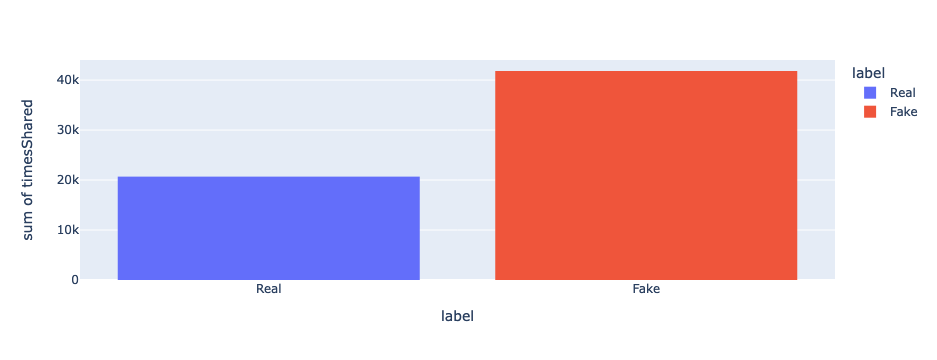

In [18]:
fig = px.histogram(subset2,x="label",y="timesShared",color="label"
            )
fig.show()

## Publisher x News at input level

In [19]:
publisher_cred = pd.read_csv(
    "publisher_cred.csv")

publisher_cred

,s,publisherURL,MBFCCredibility
0,https://nobias-project.eu/Publisher/Publisher1,http://100percentfedup.com,0.00
1,https://nobias-project.eu/Publisher/Publisher4,http://allenwestrepublic.com,0.00
2,https://nobias-project.eu/Publisher/Publisher8,http://clashdaily.com,0.00
3,https://nobias-project.eu/Publisher/Publisher9,http://cnn.it,0.75
4,https://nobias-project.eu/Publisher/Publisher10,http://conservativebyte.com,0.00
5,https://nobias-project.eu/Publisher/Publisher11,http://conservativetribune.com,0.00
6,https://nobias-project.eu/Publisher/Publisher12,http://eaglerising.com,0.00
7,https://nobias-project.eu/Publisher/Publisher14,http://goo.gl,1.00
8,https://nobias-project.eu/Publisher/Publisher18,http://opposingviews.com,0.50
9,https://nobias-project.eu/Publisher/Publisher19,http://politi.co,1.00


In [20]:
publisher_cred.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41 entries, 0 to 40
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   s                41 non-null     object 
 1   publisherURL     41 non-null     object 
 2   MBFCCredibility  41 non-null     float64
dtypes: float64(1), object(2)
memory usage: 1.1+ KB


In [21]:
news_pub = pd.read_csv(
    "news_pub_gt.csv")

news_pub

,publisher,news,publisherURL,newsTitle,newsURL,groundTruth
0,https://nobias-project.eu/Publisher/Publisher1,https://nobias-project.eu/News/BuzzfeedNews125,http://100percentfedup.com,HILLARY ON DISABLED CHILDREN During Easter Egg...,http://100percentfedup.com/hillary-on-disabled...,1.0
1,https://nobias-project.eu/Publisher/Publisher1,https://nobias-project.eu/News/BuzzfeedNews99,http://100percentfedup.com,WHOA! NEW DISTURBING VIDEO Shows HILLARY\'S Ca...,http://100percentfedup.com/new-disturbing-vide...,1.0
2,https://nobias-project.eu/Publisher/Publisher2,https://nobias-project.eu/News/BuzzfeedNews5,http://abcn.ws,"President Obama Vetoes 9/11 Victims Bill, Sett...",http://abcn.ws/2dh2NFs,0.0
3,https://nobias-project.eu/Publisher/Publisher2,https://nobias-project.eu/News/BuzzfeedNews36,http://abcn.ws,Joe Biden Slams Donald Trump\'s Comment That H...,http://abcn.ws/2d3YEVr,0.0
4,https://nobias-project.eu/Publisher/Publisher2,https://nobias-project.eu/News/BuzzfeedNews14,http://abcn.ws,Anthony Weiner Under Federal Investigation for...,http://abcn.ws/2cVpv23,0.0
...,...,...,...,...,...,...
375,https://nobias-project.eu/Publisher/Publisher99,https://nobias-project.eu/News/PolitifactNews196,http://viraldevil.com,Police Find 19 White Female Bodies In Freezers...,http://viraldevil.com/police-find-19-white-fem...,1.0
376,https://nobias-project.eu/Publisher/Publisher100,https://nobias-project.eu/News/PolitifactNews200,http://walkwithher.com,“If A Woman Is Not Intelligent Enough To Keep ...,http://walkwithher.com/kasich-if-a-woman-is-no...,1.0
377,https://nobias-project.eu/Publisher/Publisher101,https://nobias-project.eu/News/PolitifactNews201,http://wbn12.com,Vin Diesel Had This to Say About the Residents...,http://wbn12.com/rockford-illinois/vin-diesel-...,1.0
378,https://nobias-project.eu/Publisher/Publisher102,https://nobias-project.eu/News/PolitifactNews218,http://weconservative.com,Fox Star Tucker Carlson In Critical Condition ...,http://weconservative.com/breaking/breaking-fo...,1.0


In [22]:
news_pub['publisher']=news_pub['publisher'][:].str.replace("https://nobias-project.eu/News/", "")

/var/folders/q3/whys_qrs5rv5hr07rcp5ysg80000gn/T/ipykernel_41628/410477140.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.



In [23]:
news_pub['news']=news_pub['news'][:].str.replace("https://nobias-project.eu/Publisher/", "")

/var/folders/q3/whys_qrs5rv5hr07rcp5ysg80000gn/T/ipykernel_41628/258095740.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.



In [24]:
df_ = news_pub.groupby('publisher').size().sort_values().reset_index(name='count')
print (df_)

                                          publisher  count
0   https://nobias-project.eu/Publisher/Publisher99      1
1   https://nobias-project.eu/Publisher/Publisher76      1
2   https://nobias-project.eu/Publisher/Publisher40      1
3   https://nobias-project.eu/Publisher/Publisher41      1
4   https://nobias-project.eu/Publisher/Publisher43      1
..                                              ...    ...
94  https://nobias-project.eu/Publisher/Publisher13     20
95  https://nobias-project.eu/Publisher/Publisher12     23
96  https://nobias-project.eu/Publisher/Publisher21     28
97   https://nobias-project.eu/Publisher/Publisher9     45
98  https://nobias-project.eu/Publisher/Publisher19     75

[99 rows x 2 columns]


In [25]:
df_ = news_pub.groupby('publisherURL').size().sort_values().reset_index(name='count')
print (df_)

                   publisherURL  count
0        http://newsdaily12.com      1
1           http://snoopack.com      1
2             http://smag31.com      1
3          http://redherald.com      1
4   http://realnewsrightnow.com      1
..                          ...    ...
94      http://freedomdaily.com     20
95       http://eaglerising.com     23
96     http://rightwingnews.com     28
97                http://cnn.it     45
98             http://politi.co     75

[99 rows x 2 columns]


In [26]:
publish_count = df_.groupby('count').size().sort_values().reset_index(name='counts')

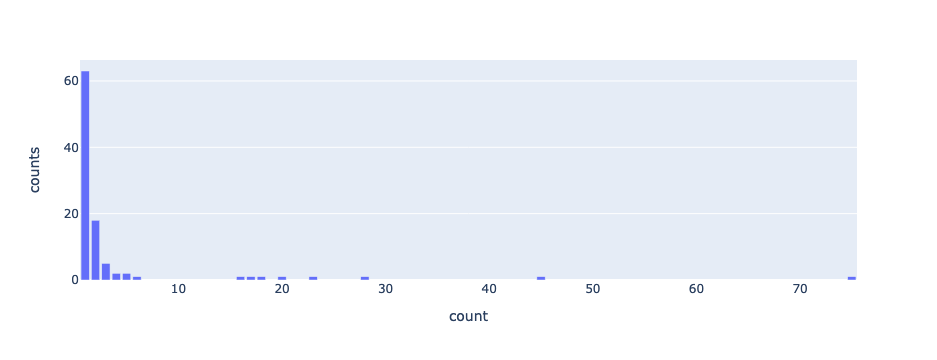

In [27]:
fig = px.bar(publish_count, x='count',y='counts')
fig.show()

### User inference

In [28]:
userinference_df = pd.read_csv(
    "userinference.csv")

userinference_df

,UserID,UserCred,SharedNews,avgCred,deviation
0,User14,0.0,1,0.0,0.0
1,User16,0.0,1,0.0,0.0
2,User9,0.0,1,0.0,0.0
3,User13,0.0,1,0.0,0.0
4,User11,0.0,1,0.0,0.0
...,...,...,...,...,...
13333,User15241,1.0,1,1.0,0.0
13334,User15252,1.0,1,1.0,0.0
13335,User15250,1.0,1,1.0,0.0
13336,User15249,1.0,1,1.0,0.0


In [29]:
print(userinference_df.nunique())

UserID        13338
UserCred        269
SharedNews       24
avgCred          36
deviation       263
dtype: int64


In [30]:
userinference_df['newsLabel'] = ["fake" if x >= 0.5 else "real" for x in userinference_df['avgCred']]

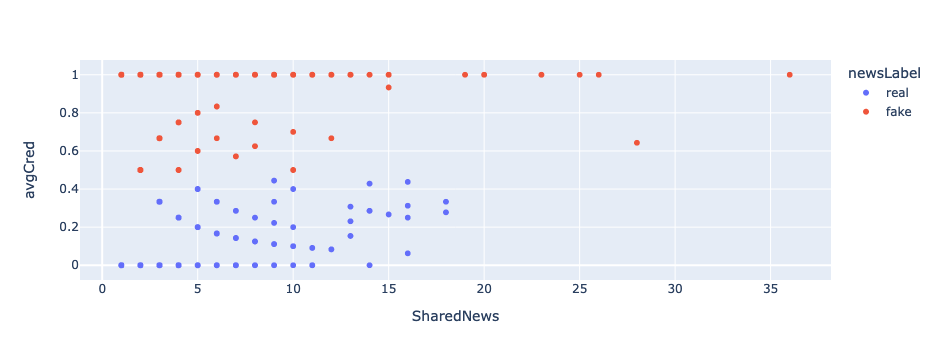

In [31]:
fig = px.scatter(userinference_df, x="SharedNews", y="avgCred",color="newsLabel")
fig.show()

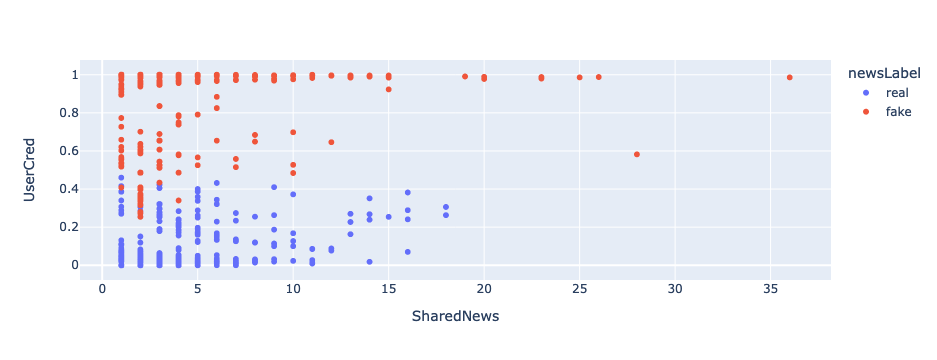

In [32]:
fig = px.scatter(userinference_df, x="SharedNews", y="UserCred",color="newsLabel")
fig.show()

In [33]:
user_df['s']=user_df['s'][:].str.replace("https://nobias-project.eu/SocialMediaUser/", "")
user_df['relatedAtom']=user_df['relatedAtom'][:].str.replace("https://nobias-project.eu/RandomVariableAtom/", "")

/var/folders/q3/whys_qrs5rv5hr07rcp5ysg80000gn/T/ipykernel_41628/2112543964.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.

/var/folders/q3/whys_qrs5rv5hr07rcp5ysg80000gn/T/ipykernel_41628/2112543964.py:2: FutureWarning:

The default value of regex will change from True to False in a future version.



In [34]:
user_df['times'] = user_df.s.map(sharingcount_df.set_index('sharingUser')['timesShared'])

In [35]:
user_df

,s,socialMediaURL,relatedAtom,inferredCredibility,times
0,BuzzfeedUser10,https://twitter.com/,RVA1,0.031,3
1,BuzzfeedUser18,https://twitter.com/,RVA2,1.000,1
2,BuzzfeedUser17,https://twitter.com/,RVA3,0.854,1
3,BuzzfeedUser16,https://twitter.com/,RVA4,0.000,1
4,BuzzfeedUser15,https://twitter.com/,RVA5,0.097,1
...,...,...,...,...,...
15111,BuzzfeedUser10835,https://twitter.com/,RVA15176,0.047,3
15112,BuzzfeedUser10836,https://twitter.com/,RVA15177,1.000,1
15113,BuzzfeedUser10837,https://twitter.com/,RVA15178,0.000,1
15114,BuzzfeedUser10838,https://twitter.com/,RVA15179,1.000,2


In [36]:
user_df['times'].quantile(.90)

3.0

In [37]:
max_thr_=user_df['times'].quantile(0.90)

In [38]:
user_qt = user_df[user_df['times']>max_thr_]

In [39]:
user_qt

,s,socialMediaURL,relatedAtom,inferredCredibility,times
9,BuzzfeedUser19,https://twitter.com/,RVA10,0.019,6
12,BuzzfeedUser11280,https://twitter.com/,RVA13,0.996,4
17,BuzzfeedUser11285,https://twitter.com/,RVA18,0.566,6
33,BuzzfeedUser30,https://twitter.com/,RVA34,0.962,4
57,BuzzfeedUser11261,https://twitter.com/,RVA58,0.029,8
...,...,...,...,...,...
15019,BuzzfeedUser9292,https://twitter.com/,RVA15083,0.043,4
15032,BuzzfeedUser9283,https://twitter.com/,RVA15096,0.994,4
15036,BuzzfeedUser10891,https://twitter.com/,RVA15100,0.000,5
15048,BuzzfeedUser10898,https://twitter.com/,RVA15112,0.995,32


In [40]:
sharingcount_df2= user_qt.groupby('times').size().sort_values().reset_index(name='count')

In [41]:
sharingcount_df2

,times,count
0,53,1
1,24,1
2,28,1
3,32,1
4,34,1
5,31,1
6,41,1
7,42,1
8,45,1
9,40,1


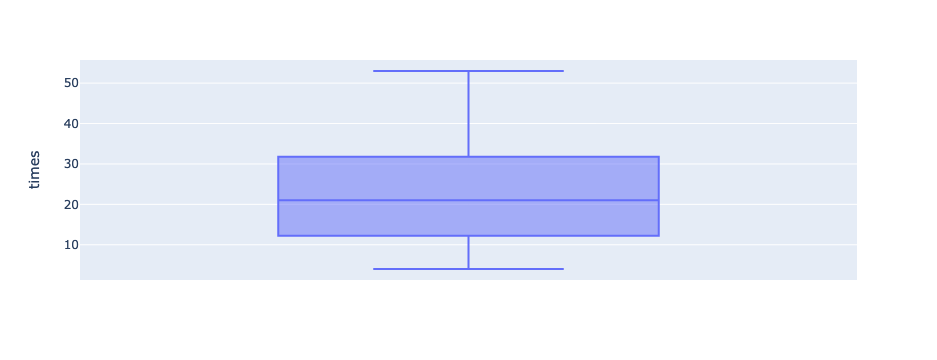

In [42]:
fig = px.box(sharingcount_df2, y="times")

fig.show()

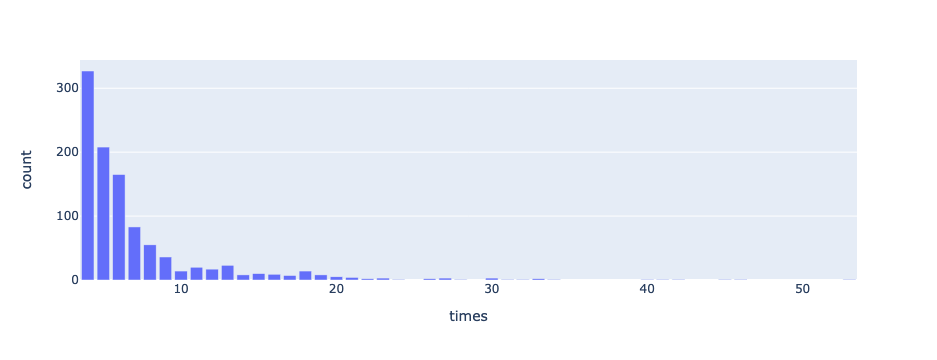

In [43]:
fig = px.bar(sharingcount_df2, x='times',y='count')
fig.show()

In [44]:
mean_avguser = statistics.mean(user_df['times'])
mean_avguser

1.6300608626620798

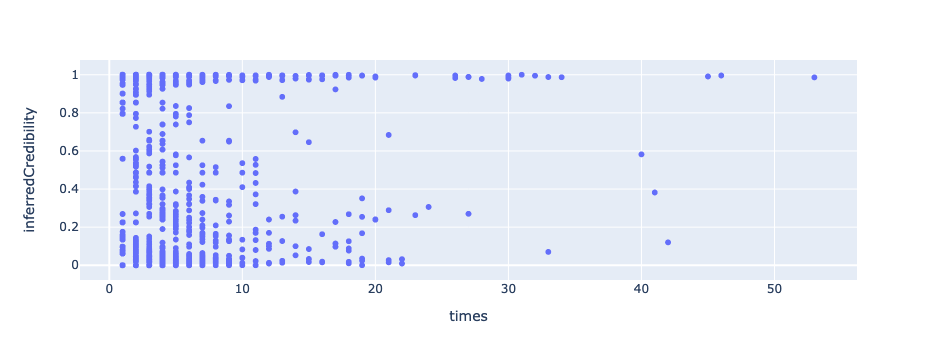

In [45]:
fig = px.scatter(user_df, x="times", y="inferredCredibility")
fig.show()

In [46]:
user_corr = user_df[['times','inferredCredibility']].corr()

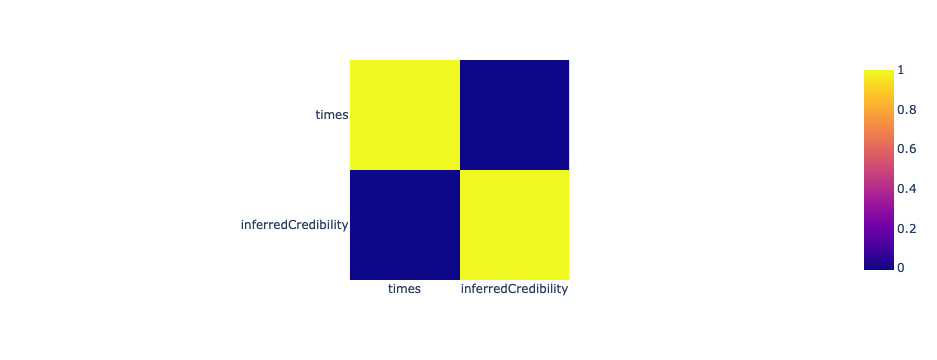

In [47]:
fig = px.imshow(user_corr)
fig.show()

In [48]:
newpub_df = pd.read_csv(
    "newspub.csv")

newpub_df

,NewsID,PublishedBy,pub_atom
0,BuzzFeed_Fake_1,http://addictinginfo.org,https://nobias-project.eu/RandomVariableAtom/R...
1,BuzzFeed_Fake_10,http://eaglerising.com,https://nobias-project.eu/RandomVariableAtom/R...
2,BuzzFeed_Fake_11,http://eaglerising.com,https://nobias-project.eu/RandomVariableAtom/R...
3,BuzzFeed_Fake_12,http://addictinginfo.org,https://nobias-project.eu/RandomVariableAtom/R...
4,BuzzFeed_Fake_13,http://proudcons.com,https://nobias-project.eu/RandomVariableAtom/R...
...,...,...,...
177,BuzzFeed_Real_88,http://eaglerising.com,https://nobias-project.eu/RandomVariableAtom/R...
178,BuzzFeed_Real_89,http://politi.co,https://nobias-project.eu/RandomVariableAtom/R...
179,BuzzFeed_Real_9,http://cnn.it,https://nobias-project.eu/RandomVariableAtom/R...
180,BuzzFeed_Real_90,http://addictinginfo.org,https://nobias-project.eu/RandomVariableAtom/R...


In [49]:
newpub_df['pub_atom']=newpub_df['pub_atom'][:].str.replace("https://nobias-project.eu/RandomVariableAtom/", "")

/var/folders/q3/whys_qrs5rv5hr07rcp5ysg80000gn/T/ipykernel_41628/1145994276.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.



In [50]:
newpubcount_df = newpub_df.groupby('PublishedBy').size().sort_values().reset_index(name='count')

In [51]:
newpubcount_df

,PublishedBy,count
0,http://opposingviews.com,1
1,http://washingtonpost.com,1
2,http://author.addictinginfo.org,1
3,http://author.groopspeak.com,1
4,http://chicksontheright.com,1
5,http://yesimright.com,1
6,http://ihavethetruth.com,2
7,http://ifyouonlynews.com,2
8,http://theblacksphere.net,2
9,http://conservativetribune.com,2


## convergence results 

In [52]:
convg_df = pd.read_csv(
    "convergenceanalysis.csv", dtype={0:'string',1:'string',2:'string',3:'string'}
)

In [53]:
convg_df['rva']=convg_df['rva'][:].str.replace("https://nobias-project.eu/RandomVariableAtom/", "")

/var/folders/q3/whys_qrs5rv5hr07rcp5ysg80000gn/T/ipykernel_41628/3168228568.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.



In [54]:
convg_df

,rva,AtomName,Type,Credibility,lastValue,convergencePoint
0,RVA5710,FAKENEWS(BuzzFeed_Fake_89),News,NotCredible,0.903,33
1,RVA778,FAKENEWS(BuzzFeed_Real_46),News,Credible,0.146,33
2,RVA9558,FAKENEWS(BuzzFeed_Fake_4),News,NotCredible,0.938,34
3,RVA8356,FAKENEWS(BuzzFeed_Fake_51),News,NotCredible,0.922,33
4,RVA8355,FAKENEWS(BuzzFeed_Fake_60),News,NotCredible,0.774,34
...,...,...,...,...,...,...
15168,RVA4698,PUBCREDLAT(http://usherald.com),Publisher,NotCredible,0.000,8
15169,RVA4309,PUBCREDLAT(http://allenwestrepublic.com),Publisher,NotCredible,0.000,10
15170,RVA4189,PUBCREDLAT(http://chicksontheright.com),Publisher,NotCredible,0.000,10
15171,RVA14551,PUBCREDLAT(http://yesimright.com),Publisher,NotCredible,0.000,12


In [55]:
convg_df['Type'].value_counts().sort_values(ascending=False)

User         15109
News            36
Publisher       28
Name: Type, dtype: Int64

In [56]:
conv_corr = convg_df[['lastValue','convergencePoint']].corr()

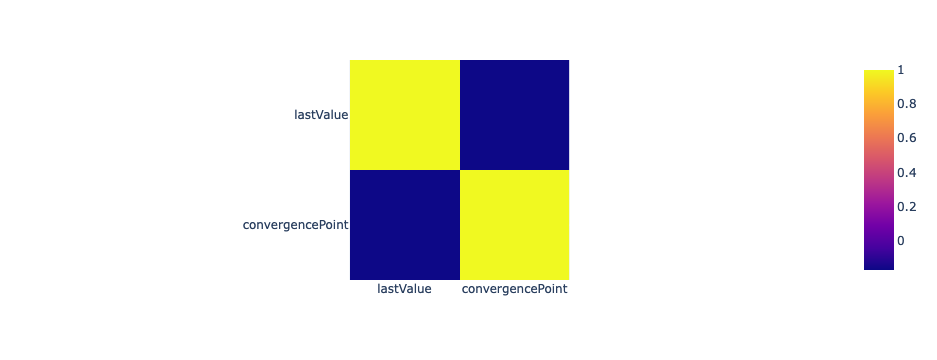

In [57]:
fig = px.imshow(conv_corr)
fig.show()

In [58]:
conv_buzz_news = convg_df[convg_df['Type']=='News']
conv_buzz_user = convg_df[convg_df['Type']=='User']
conv_buzz_pub = convg_df[convg_df['Type']=='Publisher']

In [59]:
convg_df['Credibility'].value_counts().sort_values(ascending=False)

NotCredible    7809
Credible       7364
Name: Credibility, dtype: Int64

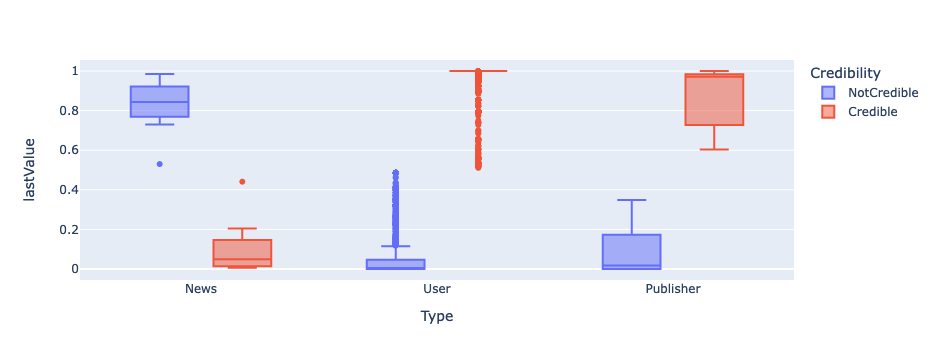

In [60]:
fig = px.box(convg_df, y="lastValue", x='Type', color="Credibility",hover_data=['AtomName'])

fig.show()

## scatter per type, since the model doesn't follow the same class. criteria for all types i.e., news are credible with 0, users are credible with 1 

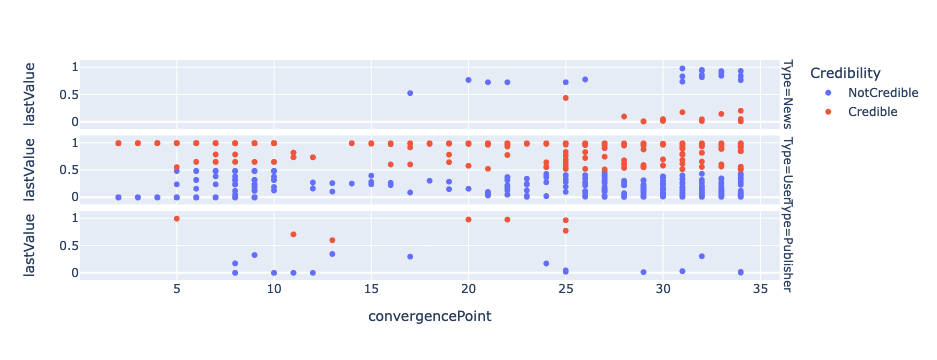

In [61]:
fig = px.scatter(convg_df,x="convergencePoint",y="lastValue", color="Credibility", facet_row="Type")
fig.show()

## news x user in classification

In [62]:
newsuser_df = pd.read_csv(
    "newsuser.csv", dtype={0:'string', 1:'string',2:'string'}
)

newsuser_df

,NewsID,SharedByUser,user_atom
0,BuzzFeed_Fake_89,User10,https://github.com/tibonto/Doc-BIAS/RandomVari...
1,BuzzFeed_Fake_80,User10,https://github.com/tibonto/Doc-BIAS/RandomVari...
2,BuzzFeed_Fake_49,User10,https://github.com/tibonto/Doc-BIAS/RandomVari...
3,BuzzFeed_Real_45,User18,https://github.com/tibonto/Doc-BIAS/RandomVari...
4,BuzzFeed_Real_46,User17,https://github.com/tibonto/Doc-BIAS/RandomVari...
...,...,...,...
22401,BuzzFeed_Real_31,User10836,https://github.com/tibonto/Doc-BIAS/RandomVari...
22402,BuzzFeed_Fake_35,User10837,https://github.com/tibonto/Doc-BIAS/RandomVari...
22403,BuzzFeed_Real_91,User10838,https://github.com/tibonto/Doc-BIAS/RandomVari...
22404,BuzzFeed_Real_72,User10838,https://github.com/tibonto/Doc-BIAS/RandomVari...


In [63]:
newsuser_df['user_atom']=newsuser_df['user_atom'][:].str.replace("https://github.com/tibonto/Doc-BIAS/RandomVariableAtom/", "")

/var/folders/q3/whys_qrs5rv5hr07rcp5ysg80000gn/T/ipykernel_41628/2525275251.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.



In [64]:
df1 = newsuser_df.groupby('NewsID').size().sort_values().reset_index(name='count')
print (df1)

               NewsID  count
0    BuzzFeed_Real_63      1
1    BuzzFeed_Fake_26      1
2    BuzzFeed_Fake_43      2
3    BuzzFeed_Fake_32      2
4    BuzzFeed_Real_47      2
..                ...    ...
177  BuzzFeed_Fake_62    933
178  BuzzFeed_Fake_49    992
179  BuzzFeed_Fake_89   1044
180  BuzzFeed_Real_32   1117
181  BuzzFeed_Real_45   1166

[182 rows x 2 columns]


In [65]:
df2 = newsuser_df.groupby('SharedByUser').size().sort_values().reset_index(name='count')
print (df2)

      SharedByUser  count
0            User1      1
1         User4931      1
2         User4932      1
3         User4933      1
4         User4934      1
...            ...    ...
15111     User6611     28
15112     User4463     28
15113     User5392     32
15114     User2671     34
15115    User14404     47

[15116 rows x 2 columns]


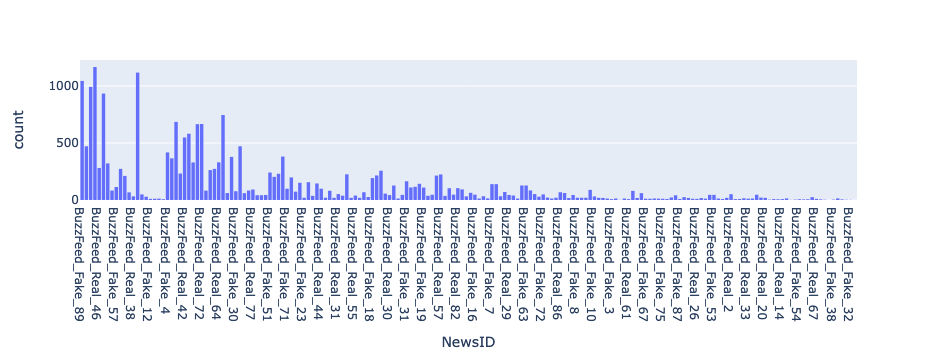

In [66]:
fig = px.histogram(newsuser_df,x="NewsID")
fig.show()

In [67]:
df1['count'].quantile(.90)

328.20000000000005

In [68]:
max_thr=df1['count'].quantile(0.90)

In [69]:
df1[df1['count']>max_thr]

,NewsID,count
163,BuzzFeed_Fake_47,329
164,BuzzFeed_Real_64,330
165,BuzzFeed_Fake_36,365
166,BuzzFeed_Fake_90,378
167,BuzzFeed_Fake_35,381
168,BuzzFeed_Fake_4,417
169,BuzzFeed_Real_6,471
170,BuzzFeed_Fake_80,471
171,BuzzFeed_Real_42,548
172,BuzzFeed_Real_91,581


In [70]:
19/182

0.1043956043956044

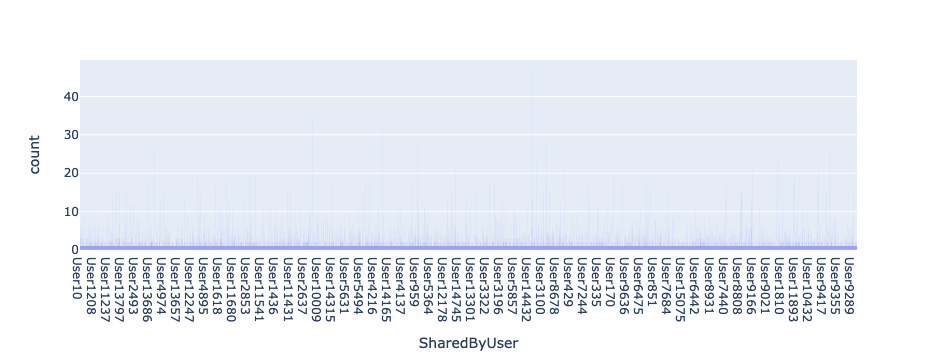

In [71]:
fig = px.histogram(newsuser_df,x="SharedByUser")
fig.show()

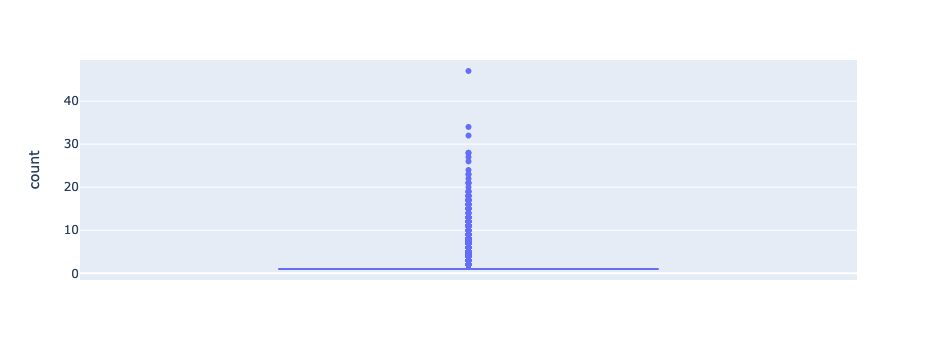

In [72]:
fig = px.box(df2,y="count",hover_data=["SharedByUser"])
fig.show()

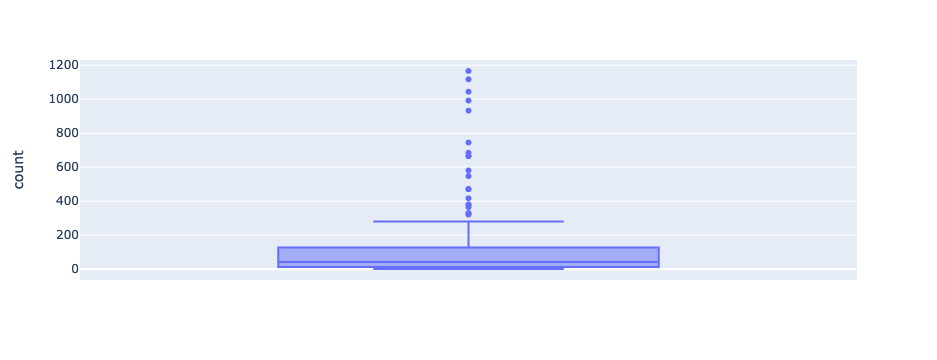

In [73]:
fig = px.box(df1,y="count",hover_data=["NewsID"])
fig.show()

## convg_df speed breakdown

In [74]:
# TODO: normalize "Convergence iteration" (min-max, standardization)
# TODO: explore iterations by type (median by type +- mad)

In [75]:
# Replace URLs
convg_df['rva']=convg_df['rva'][:].str.replace("https://nobias-project.eu/RandomVariableAtom/", "")

/var/folders/q3/whys_qrs5rv5hr07rcp5ysg80000gn/T/ipykernel_41628/473152803.py:2: FutureWarning:

The default value of regex will change from True to False in a future version.



In [76]:
convg_df

,rva,AtomName,Type,Credibility,lastValue,convergencePoint
0,RVA5710,FAKENEWS(BuzzFeed_Fake_89),News,NotCredible,0.903,33
1,RVA778,FAKENEWS(BuzzFeed_Real_46),News,Credible,0.146,33
2,RVA9558,FAKENEWS(BuzzFeed_Fake_4),News,NotCredible,0.938,34
3,RVA8356,FAKENEWS(BuzzFeed_Fake_51),News,NotCredible,0.922,33
4,RVA8355,FAKENEWS(BuzzFeed_Fake_60),News,NotCredible,0.774,34
...,...,...,...,...,...,...
15168,RVA4698,PUBCREDLAT(http://usherald.com),Publisher,NotCredible,0.000,8
15169,RVA4309,PUBCREDLAT(http://allenwestrepublic.com),Publisher,NotCredible,0.000,10
15170,RVA4189,PUBCREDLAT(http://chicksontheright.com),Publisher,NotCredible,0.000,10
15171,RVA14551,PUBCREDLAT(http://yesimright.com),Publisher,NotCredible,0.000,12


In [77]:
mean_conv = statistics.mean(convg_df['convergencePoint'])
mean_conv

12.43353324985171

In [78]:
var_conv = statistics.variance(convg_df['convergencePoint'])
var_conv

111.10085804656443

In [79]:
std_covg = statistics.stdev(convg_df['convergencePoint'])
std_covg

10.540439177119918

In [80]:
scipy.stats.skew(convg_df['convergencePoint'], bias=False)

1.2125085165152483

In [81]:
convg_df['optispeed'] = ["slow" if x >= 13 else "fast" for x in convg_df['convergencePoint']]

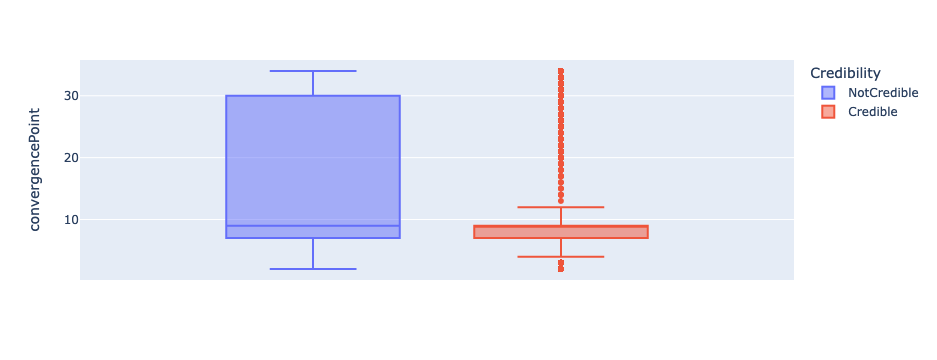

In [82]:
fig = px.box(convg_df,y="convergencePoint", color='Credibility')
fig.show()

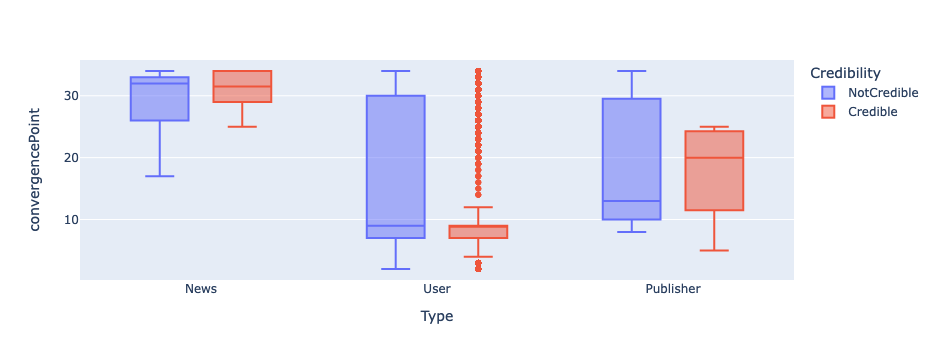

In [83]:
fig = px.box(convg_df, y="convergencePoint", x='Type', color="Credibility")

fig.show()

In [84]:
conv_buzz_slow = convg_df[convg_df['optispeed']=='slow']

In [85]:
conv_buzz_fast = convg_df[convg_df['optispeed']=='fast']

In [86]:
convg_pub = convg_df[convg_df['Type']=='Publisher']
convg_pub

,rva,AtomName,Type,Credibility,lastValue,convergencePoint,optispeed
15145,RVA2157,PUBCREDLAT(http://abcn.ws),Publisher,Credible,0.971,25,slow
15146,RVA8436,PUBCREDLAT(http://cnn.it),Publisher,Credible,0.983,22,slow
15147,RVA13434,PUBCREDLAT(http://eaglerising.com),Publisher,NotCredible,0.307,32,slow
15148,RVA14959,PUBCREDLAT(http://politi.co),Publisher,Credible,0.984,20,slow
15149,RVA11888,PUBCREDLAT(http://rightwingnews.com),Publisher,NotCredible,0.299,17,slow
15150,RVA5012,PUBCREDLAT(http://winningdemocrats.com),Publisher,NotCredible,0.329,9,fast
15151,RVA10910,PUBCREDLAT(http://addictinginfo.org),Publisher,Credible,0.603,13,slow
15152,RVA12848,PUBCREDLAT(http://occupydemocrats.com),Publisher,NotCredible,0.173,24,slow
15153,RVA1803,PUBCREDLAT(http://ifyouonlynews.com),Publisher,Credible,0.777,25,slow
15154,RVA4060,PUBCREDLAT(http://opposingviews.com),Publisher,Credible,0.710,11,fast


In [87]:
convg_grouped=convg_pub.groupby(['Credibility','optispeed'])
convg_grouped.size()

Credibility  optispeed
Credible     fast          2
             slow          5
NotCredible  fast         10
             slow         11
dtype: int64

In [88]:
conv_buzz_slow['Type'].value_counts()
#users 3360/15109
#news 36/36
#publisher 16/28

User         3360
News           36
Publisher      16
Name: Type, dtype: Int64

In [89]:
conv_buzz_slow['Credibility'].value_counts().sort_values(ascending=False)

NotCredible    2318
Credible       1094
Name: Credibility, dtype: Int64

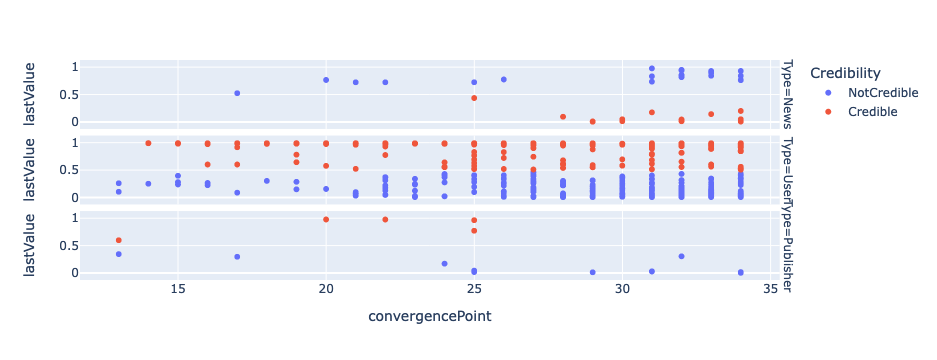

In [90]:
fig = px.scatter(conv_buzz_slow,x="convergencePoint",y="lastValue", color="Credibility", facet_row="Type")
fig.show()

In [91]:
print((36/36)*100)
print((16/28)*100)
print((3360/15109)*100)

100.0
57.14285714285714
22.23840095307433


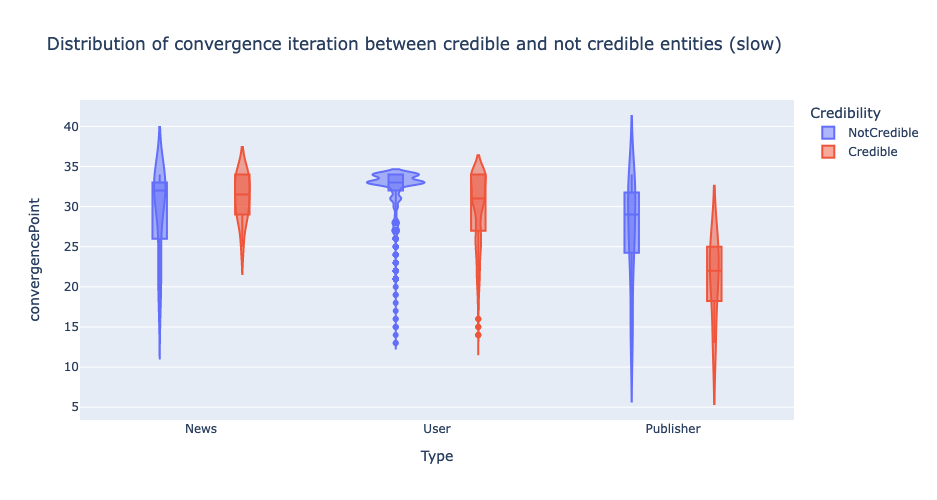

In [92]:
fig = px.violin(
    data_frame=conv_buzz_slow,
    x="Type",
    y="convergencePoint",
    color="Credibility",
    # points="all",
    box=True,
    width=1000,
    height=500,
    title="Distribution of convergence iteration between credible and not credible entities (slow)"
)
fig.show()

PUBCREDLAT(http://100percentfedup.com)       NotCredible  slow  
PUBCREDLAT(http://clashdaily.com)            NotCredible  slow 
PUBCREDLAT(http://conservativebyte.com)      NotCredible  slow         
PUBCREDLAT(http://conservativetribune.com)   NotCredible  slow         
PUBCREDLAT(http://eaglerising.com)           NotCredible  slow         
PUBCREDLAT(http://freedomdaily.com)          NotCredible  slow         
PUBCREDLAT(http://goo.gl)                    NotCredible  slow
PUBCREDLAT(http://ihavethetruth.com)         NotCredible  slow         
PUBCREDLAT(http://occupydemocrats.com)       NotCredible  slow 
PUBCREDLAT(http://rightwingnews.com)         NotCredible  slow 
PUBCREDLAT(unknown)                          NotCredible  slow 

PUBCREDLAT(http://abcn.ws)                   Credible     slow         
PUBCREDLAT(http://addictinginfo.org)         Credible     slow
PUBCREDLAT(http://cnn.it)                    Credible     slow
PUBCREDLAT(http://ifyouonlynews.com)         Credible     slow 
PUBCREDLAT(http://politi.co)                 Credible     slow

In [93]:
pub_atoms_df = pd.read_csv(
    "pubatom.csv"
)

pub_atoms_df

,rva,name,value,credibility
0,https://nobias-project.eu/RandomVariableAtom/R...,PUBCREDLAT(http://abcn.ws),0.971,Credible
1,https://nobias-project.eu/RandomVariableAtom/R...,PUBCREDLAT(http://cnn.it),0.983,Credible
2,https://nobias-project.eu/RandomVariableAtom/R...,PUBCREDLAT(http://eaglerising.com),0.307,NotCredible
3,https://nobias-project.eu/RandomVariableAtom/R...,PUBCREDLAT(http://politi.co),0.984,Credible
4,https://nobias-project.eu/RandomVariableAtom/R...,PUBCREDLAT(http://rightwingnews.com),0.299,NotCredible
5,https://nobias-project.eu/RandomVariableAtom/R...,PUBCREDLAT(http://winningdemocrats.com),0.329,NotCredible
6,https://nobias-project.eu/RandomVariableAtom/R...,PUBCREDLAT(http://addictinginfo.org),0.603,Credible
7,https://nobias-project.eu/RandomVariableAtom/R...,PUBCREDLAT(http://occupydemocrats.com),0.173,NotCredible
8,https://nobias-project.eu/RandomVariableAtom/R...,PUBCREDLAT(http://ifyouonlynews.com),0.777,Credible
9,https://nobias-project.eu/RandomVariableAtom/R...,PUBCREDLAT(http://opposingviews.com),0.710,Credible


In [94]:
pub_atoms_df['rva']=pub_atoms_df['rva'][:].str.replace("https://nobias-project.eu/RandomVariableAtom/", "")

/var/folders/q3/whys_qrs5rv5hr07rcp5ysg80000gn/T/ipykernel_41628/1670141917.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.



In [95]:
pub_atoms_df

,rva,name,value,credibility
0,RVA2157,PUBCREDLAT(http://abcn.ws),0.971,Credible
1,RVA8436,PUBCREDLAT(http://cnn.it),0.983,Credible
2,RVA13434,PUBCREDLAT(http://eaglerising.com),0.307,NotCredible
3,RVA14959,PUBCREDLAT(http://politi.co),0.984,Credible
4,RVA11888,PUBCREDLAT(http://rightwingnews.com),0.299,NotCredible
5,RVA5012,PUBCREDLAT(http://winningdemocrats.com),0.329,NotCredible
6,RVA10910,PUBCREDLAT(http://addictinginfo.org),0.603,Credible
7,RVA12848,PUBCREDLAT(http://occupydemocrats.com),0.173,NotCredible
8,RVA1803,PUBCREDLAT(http://ifyouonlynews.com),0.777,Credible
9,RVA4060,PUBCREDLAT(http://opposingviews.com),0.710,Credible


In [96]:
gr_rules = pd.read_csv(
    "ground_rules.csv"
)

gr_rules

,rva,name,groundrule_reference,rule
0,https://nobias-project.eu/RandomVariableAtom/R...,USERCREDLAT(4526),https://nobias-project.eu/GroundRule/GR3789,https://nobias-project.eu/Rule/Rule5
1,https://nobias-project.eu/RandomVariableAtom/R...,USERCREDLAT(4526),https://nobias-project.eu/GroundRule/GR3791,https://nobias-project.eu/Rule/Rule5
2,https://nobias-project.eu/RandomVariableAtom/R...,USERCREDLAT(2),https://nobias-project.eu/GroundRule/GR10,https://nobias-project.eu/Rule/Rule5
3,https://nobias-project.eu/RandomVariableAtom/R...,USERCREDLAT(2091),https://nobias-project.eu/GroundRule/GR1762,https://nobias-project.eu/Rule/Rule5
4,https://nobias-project.eu/RandomVariableAtom/R...,USERCREDLAT(2793),https://nobias-project.eu/GroundRule/GR2370,https://nobias-project.eu/Rule/Rule5
...,...,...,...,...
1190131,https://nobias-project.eu/RandomVariableAtom/R...,USERCREDLAT(115),https://nobias-project.eu/GroundRule/GR99,https://nobias-project.eu/Rule/Rule5
1190132,https://nobias-project.eu/RandomVariableAtom/R...,USERCREDLAT(115),https://nobias-project.eu/GroundRule/GR99,https://nobias-project.eu/Rule/Rule5
1190133,https://nobias-project.eu/RandomVariableAtom/R...,USERCREDLAT(115),https://nobias-project.eu/GroundRule/GR99,https://nobias-project.eu/Rule/Rule5
1190134,https://nobias-project.eu/RandomVariableAtom/R...,USERCREDLAT(115),https://nobias-project.eu/GroundRule/GR99,https://nobias-project.eu/Rule/Rule5


In [97]:
gr_rules.groupby('rule').size().sort_values()

rule
https://nobias-project.eu/Rule/Rule1       204
https://nobias-project.eu/Rule/Rule2       374
https://nobias-project.eu/Rule/Rule3      4896
https://nobias-project.eu/Rule/Rule4      4964
https://nobias-project.eu/Rule/Rule5    576946
https://nobias-project.eu/Rule/Rule6    602752
dtype: int64

In [98]:
gr_count = pd.read_csv(
    "groundrulecountassoc.csv"
)

gr_count

,name,rva,groundRuleCount
0,FAKENEWS(BuzzFeed_Fake_89),https://nobias-project.eu/RandomVariableAtom/R...,2090
1,FAKENEWS(BuzzFeed_Fake_4),https://nobias-project.eu/RandomVariableAtom/R...,836
2,FAKENEWS(BuzzFeed_Real_46),https://nobias-project.eu/RandomVariableAtom/R...,564
3,FAKENEWS(BuzzFeed_Real_13),https://nobias-project.eu/RandomVariableAtom/R...,516
4,FAKENEWS(BuzzFeed_Fake_51),https://nobias-project.eu/RandomVariableAtom/R...,484
...,...,...,...
15175,USERCREDLAT(999),https://nobias-project.eu/RandomVariableAtom/R...,1
15176,USERCREDLAT(9990),https://nobias-project.eu/RandomVariableAtom/R...,1
15177,USERCREDLAT(9995),https://nobias-project.eu/RandomVariableAtom/R...,1
15178,USERCREDLAT(9996),https://nobias-project.eu/RandomVariableAtom/R...,1


In [99]:
mean_groundrule = statistics.mean(gr_count['groundRuleCount'])
mean_groundrule

2.3059288537549407

In [100]:
std_groundrule = statistics.stdev(gr_count['groundRuleCount'])
std_groundrule

21.38950030110216

In [101]:
class_results_pd = pd.read_csv(
    "classifiednews.csv"
)

class_results_pd

,NewsID,PublishedBy,SharingUsers,Prediction,TruthValue,PubCred,avgUserCred,predictionError
0,BuzzFeed_Fake_4,http://freedomdaily.com,4587,0.938,1,0.014,0.061539,0.062
1,BuzzFeed_Real_54,http://ifyouonlynews.com,13,0.441,0,0.777,0.545923,0.441
2,BuzzFeed_Real_2,http://politi.co,561,0.016,0,0.984,0.983548,0.016
3,BuzzFeed_Real_1,http://politi.co,143,0.742,0,0.984,0.252385,0.742
4,BuzzFeed_Real_4,http://politi.co,66,0.985,0,0.984,0.015667,0.985
5,BuzzFeed_Real_13,http://abcn.ws,257,0.204,0,0.971,0.793057,0.204
6,BuzzFeed_Real_41,http://abcn.ws,103,0.047,0,0.971,0.951233,0.047
7,BuzzFeed_Fake_78,http://ihavethetruth.com,203,0.937,1,0.032,0.062374,0.063
8,BuzzFeed_Fake_9,http://thepoliticalinsider.com,381,0.848,1,0.174,0.150504,0.152
9,BuzzFeed_Fake_89,http://conservativetribune.com,1044,0.903,1,0.029,0.095686,0.097


In [102]:
class_results_corr = class_results_pd[['SharingUsers','PubCred','avgUserCred','Prediction']].corr()

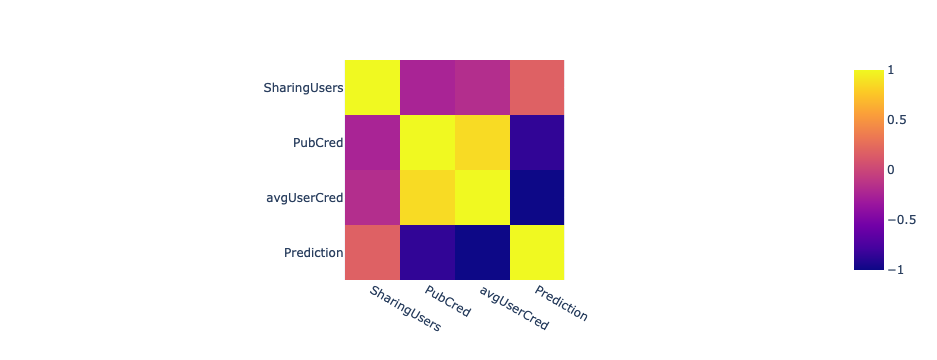

In [103]:
fig = px.imshow(class_results_corr)
fig.show()

In [104]:
class_results_pd['class_label'] = ["fake" if x >= 0.5 else "real" for x in class_results_pd['Prediction']]

In [105]:
class_rate=class_results_pd.groupby('class_label').size().sort_values().reset_index(name='count')

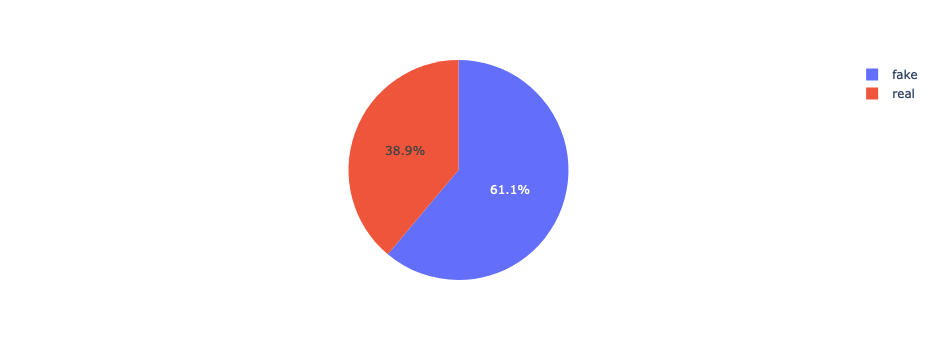

In [106]:
fig = px.pie(class_rate, values='count', names='class_label')
fig.show()

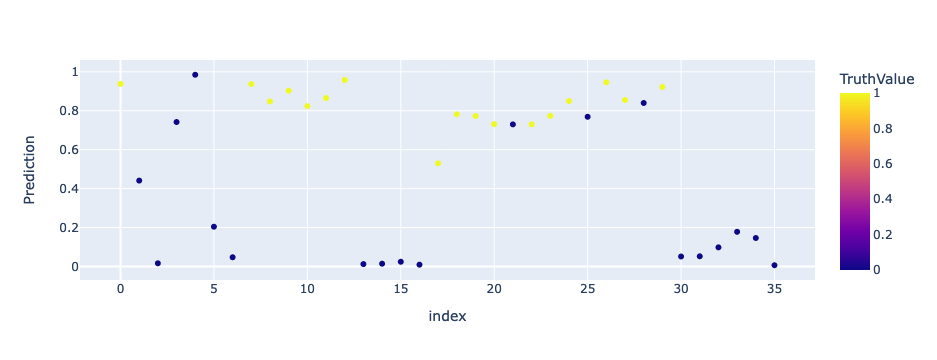

In [107]:
fig = px.scatter(class_results_pd, y="Prediction", color="TruthValue",hover_data=['NewsID'])
fig.show()

In [108]:
df3 = class_results_pd.groupby('PublishedBy').size().sort_values().reset_index(name='count')
print (df3)

                       PublishedBy  count
0         http://addictinginfo.org      1
1   http://conservativetribune.com      1
2         http://ifyouonlynews.com      1
3         http://ihavethetruth.com      1
4       http://occupydemocrats.com      1
5   http://thepoliticalinsider.com      1
6                   http://abcn.ws      2
7                          unknown      2
8          http://freedomdaily.com      3
9                    http://cnn.it      4
10          http://eaglerising.com      5
11        http://rightwingnews.com      5
12                http://politi.co      9


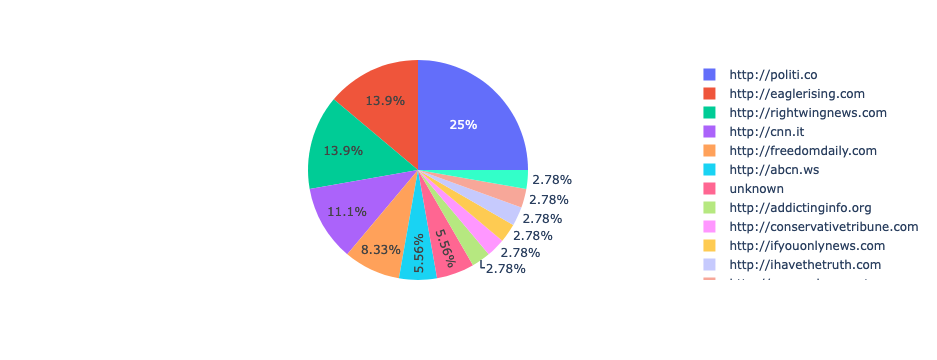

In [109]:
fig = px.pie(df3, values='count', names='PublishedBy')
fig.show()

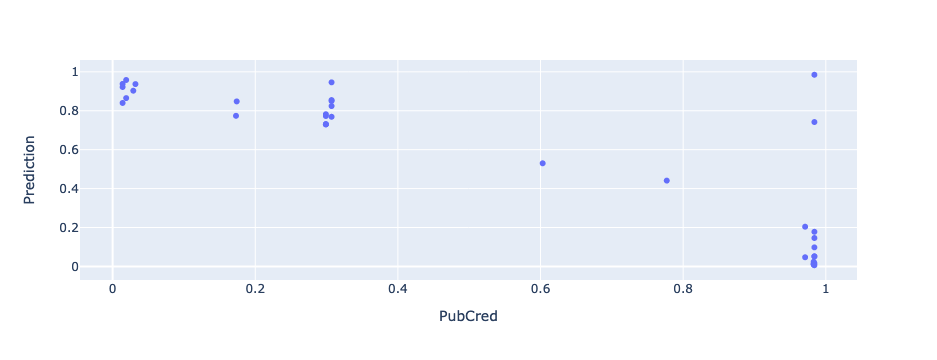

In [110]:
fig = px.scatter(class_results_pd,x="PubCred", y="Prediction")
fig.show()

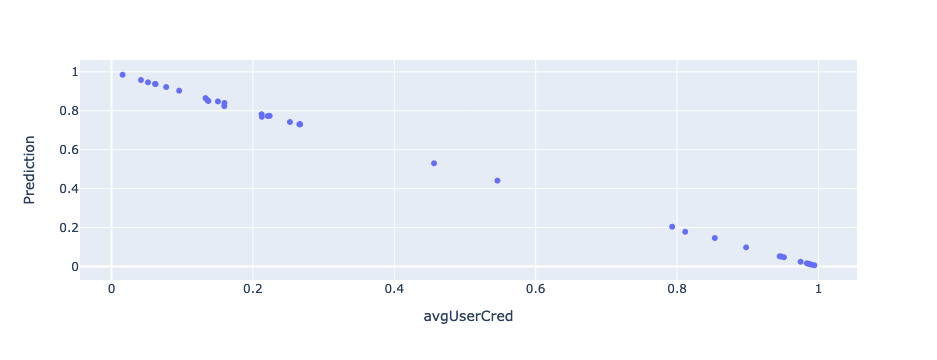

In [111]:
fig = px.scatter(class_results_pd,x="avgUserCred", y="Prediction")
fig.show()

In [112]:
jac_users = pd.read_csv(
    "jac_users.csv")

,userA,userB,newsDiversityA,newsDiversityB,jaccardScore
0,https://nobias-project.eu/SocialMediaUser/Buzz...,https://nobias-project.eu/SocialMediaUser/Buzz...,4,4,1.000000
1,https://nobias-project.eu/SocialMediaUser/Buzz...,https://nobias-project.eu/SocialMediaUser/Buzz...,4,4,1.000000
2,https://nobias-project.eu/SocialMediaUser/Buzz...,https://nobias-project.eu/SocialMediaUser/Buzz...,4,4,1.000000
3,https://nobias-project.eu/SocialMediaUser/Buzz...,https://nobias-project.eu/SocialMediaUser/Buzz...,4,4,1.000000
4,https://nobias-project.eu/SocialMediaUser/Buzz...,https://nobias-project.eu/SocialMediaUser/Buzz...,4,4,1.000000
...,...,...,...,...,...
151,https://nobias-project.eu/SocialMediaUser/Buzz...,https://nobias-project.eu/SocialMediaUser/Buzz...,4,18,0.047619
152,https://nobias-project.eu/SocialMediaUser/Buzz...,https://nobias-project.eu/SocialMediaUser/Buzz...,18,4,0.047619
153,https://nobias-project.eu/SocialMediaUser/Buzz...,https://nobias-project.eu/SocialMediaUser/Buzz...,18,4,0.047619
154,https://nobias-project.eu/SocialMediaUser/Buzz...,https://nobias-project.eu/SocialMediaUser/Buzz...,5,18,0.045455


In [114]:
jac_users['userA']=jac_users['userA'][:].str.replace("https://nobias-project.eu/SocialMediaUser/", "")
jac_users['userB']=jac_users['userB'][:].str.replace("https://nobias-project.eu/SocialMediaUser/", "")

/var/folders/q3/whys_qrs5rv5hr07rcp5ysg80000gn/T/ipykernel_41628/2005151634.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.

/var/folders/q3/whys_qrs5rv5hr07rcp5ysg80000gn/T/ipykernel_41628/2005151634.py:2: FutureWarning:

The default value of regex will change from True to False in a future version.



In [115]:
jac_users

,userA,userB,newsDiversityA,newsDiversityB,jaccardScore
0,BuzzfeedUser10351,BuzzfeedUser3185,4,4,1.000000
1,BuzzfeedUser10351,BuzzfeedUser7040,4,4,1.000000
2,BuzzfeedUser10351,BuzzfeedUser8597,4,4,1.000000
3,BuzzfeedUser3185,BuzzfeedUser10351,4,4,1.000000
4,BuzzfeedUser3185,BuzzfeedUser7040,4,4,1.000000
...,...,...,...,...,...
151,BuzzfeedUser7194,BuzzfeedUser14260,4,18,0.047619
152,BuzzfeedUser12499,BuzzfeedUser7194,18,4,0.047619
153,BuzzfeedUser14260,BuzzfeedUser7194,18,4,0.047619
154,BuzzfeedUser5320,BuzzfeedUser14260,5,18,0.045455


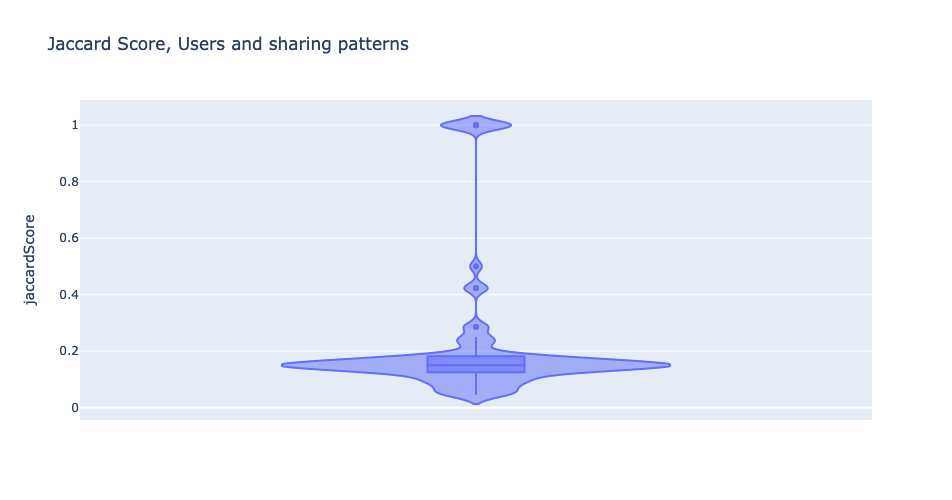

In [119]:
fig = px.violin(
    data_frame=jac_users,
    y="jaccardScore",
    # points="all",
    box=True,
    width=1000,
    height=500,
    title="Jaccard Score, Users and sharing patterns"
)
fig.show()

In [ ]:
# establish threshold for score over 0.5
# calculate percentage of users over threshold to document ingroup bias 
# color code according to credibility profile
